# Training Analysis

In [1]:
import os
import sys
from tqdm import tqdm
import natsort
import glob
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import torch
import seaborn as sns
import cv2
import plotly.express as px
import plotly.graph_objects as go
from loguru import logger
from PIL import Image

from data.loader import define_loaders
from utils.utils import load_config
from utils.torch import load_model_weights
from model_zoo.models import define_model
from utils.plot import plot_metrics, plot_training_loss
from data.dataset import Sentinel2Dataset, read_images
from training.metrics import MultiSpectralMetrics
from post_training.post_training import (generate_exp_paths,prepare_paths, prepare_data,
                                         evaluate_and_plot, calculate_valid_pixel_percentages,
                                         plot_3d_scatter)


/home/ubuntu/miniconda3/envs/ai_processor/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Load Config

In [2]:
path = "/home/ubuntu/project/sentinel-2-ai-processor/src/results/2025-06-12_20-19-14"
exp_paths = generate_exp_paths(exp_path=path)
config = load_config(config_path=f"{exp_paths['result_dir']}/config.yaml")

## Training metrics and losses plot

In [3]:
version = config['DATASET']['version']
bands = config['DATASET']['bands']
resize = config['TRAINING']['resize']
num_workers = config['TRAINING']['num_workers']

df_loss = pd.read_csv(f"{exp_paths['metrics_path']}/losses.csv")
df_ssim = pd.read_csv(f"{exp_paths['metrics_path']}/ssim_metrics.csv")
df_sam = pd.read_csv(f"{exp_paths['metrics_path']}/sam_metrics.csv")
df_rmse = pd.read_csv(f"{exp_paths['metrics_path']}/rmse_metrics.csv")
df_psnr = pd.read_csv(f"{exp_paths['metrics_path']}/psnr_metrics.csv")

In [4]:
# Plot all metrics
metrics = {
    "PSNR": df_psnr,
    "SSIM": df_ssim,
    "SAM": df_sam,
    "RMSE": df_rmse
}
for title, df_metric in metrics.items():
    plot_metrics(df_metric, bands=bands, title=f"{title} Evolution During Training - Dataset {version}",
                log_scale=False, y_label=title, verbose=False, save=True,
                save_path=exp_paths['metrics_path'], color_palette="plasma")

In [5]:
plot_training_loss(df=df_loss,
                title="Training and Validation Loss",
                y_label="Loss",
                log_scale=False,
                verbose=False,
                save=True,
                save_path=exp_paths['metrics_path'],
                color_palette="plasma"
                )

## Create Dataset

In [6]:
# Load test data
test_dir = f"/mnt/disk/dataset/sentinel-ai-processor/{version}/test/"
df_test_input, df_test_output = prepare_paths(test_dir)

In [7]:
df_test_output = calculate_valid_pixel_percentages(df=df_test_output, column_name="path", show_progress=True)
test_dataset = Sentinel2Dataset(df_x=df_test_input, df_y=df_test_output, train=True, augmentation=False, img_size=resize)
test_loader = define_loaders(
    train_dataset=test_dataset,
    val_dataset=None,
    train=False,
    batch_size=1,
    num_workers=num_workers
)

Processing Valid Pixel: 100%|█████████████████████████████████████| 530/530 [00:28<00:00, 18.62it/s]


## Load Model 

In [8]:
weights_path = f"{exp_paths['checkpoint_path']}/best_model.pth"
model = define_model(name=config["MODEL"]["model_name"],
                    encoder_name=config["MODEL"]["encoder_name"],
                    in_channel=len(bands),
                    out_channels=len(bands),
                    activation=config["MODEL"]["activation"])

# Load best model weights
model = load_model_weights(model=model, filename=weights_path)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

2025-06-13 09:57:44.064 | INFO     | utils.torch:load_model_weights:103 - 
 -> Loading encoder weights from /home/ubuntu/project/sentinel-2-ai-processor/src/results/2025-06-12_20-19-14/checkpoints/best_model.pth



## Test Dataset inference

In [9]:
test_metrics_tracker = MultiSpectralMetrics(bands=bands, device=device)
metrics_dict = {f"{metric}_{band}": [] for band in test_metrics_tracker.bands for metric in ['psnr', 'rmse', 'ssim', 'sam']}

# Reset tracker and model evaluation
model.eval()
test_metrics_tracker.reset()
criterion = torch.nn.MSELoss()
with torch.no_grad():
    with tqdm(total=len(test_loader.dataset), ncols=100, colour='#cc99ff') as t:
        for x_data, y_data, valid_mask in test_loader:
            x_data, y_data, valid_mask  = x_data.to(device), y_data.to(device), valid_mask.to(device)
            outputs = model(x_data)
            test_metrics_tracker.reset()
            test_metrics_tracker.update(outputs, y_data, valid_mask )
            metrics = test_metrics_tracker.compute()
            for band in test_metrics_tracker.bands:
                for metric_name in ['psnr', 'rmse', 'ssim', 'sam']:
                    metrics_dict[f"{metric_name}_{band}"].append(metrics[band][metric_name])

            t.update(x_data.size(0))

# Update DataFrame with metrics
for column_name, values in metrics_dict.items():
    df_test_output[column_name] = values

100%|█████████████████████████████████████████████████████████████| 530/530 [00:31<00:00, 16.68it/s]


## Visualize Random Inference data 

In [107]:
# get data with 100 valid pixel

df_test = df_test_output[df_test_output['valid_pixel']==100]
# df_test = df_test[df_test['cloud_cover']<40]
# df_test = df_test[df_test['ssim_B02']>0.94]

df_test

,id_key,Name,S3Path,Footprint,GeoFootprint,cloud_cover,path,processing_baseline,valid_pixel,psnr_B02,...,ssim_B02,sam_B02,psnr_B03,rmse_B03,ssim_B03,sam_B03,psnr_B04,rmse_B04,ssim_B04,sam_B04
3,S2B_MSIL1C_20180117T102339_N0500_R065_T32TMR,S2B_MSIL2A_20180117T102339_N0500_R065_T32TMR_2...,/eodata/Sentinel-2/MSI/L2A_N0500/2018/01/17/S2...,geography'SRID=4326;POLYGON ((7.70695108472353...,"{'type': 'Polygon', 'coordinates': [[[7.706951...",93.384999,/mnt/disk/dataset/sentinel-ai-processor/V3/tes...,500,100.0,29.546831,...,0.947126,0.033741,30.935396,0.028394,0.957322,0.028700,31.287031,0.027268,0.957135,0.025501
4,S2B_MSIL1C_20180202T104239_N0500_R008_T31TEM,S2B_MSIL2A_20180202T104239_N0500_R008_T31TEM_2...,/eodata/Sentinel-2/MSI/L2A_N0500/2018/02/02/S2...,geography'SRID=4326;POLYGON ((2.99973715756221...,"{'type': 'Polygon', 'coordinates': [[[2.999737...",90.962285,/mnt/disk/dataset/sentinel-ai-processor/V3/tes...,500,100.0,29.603010,...,0.938860,0.033875,31.557983,0.026430,0.969968,0.027135,31.995384,0.025132,0.973328,0.025412
13,S2B_MSIL1C_20180430T103019_N0500_R108_T32TLS,S2B_MSIL2A_20180430T103019_N0500_R108_T32TLS_2...,/eodata/Sentinel-2/MSI/L2A_N0500/2018/04/30/S2...,geography'SRID=4326;POLYGON ((6.37298980760992...,"{'type': 'Polygon', 'coordinates': [[[6.372989...",51.573217,/mnt/disk/dataset/sentinel-ai-processor/V3/tes...,500,100.0,24.835396,...,0.917952,0.075315,26.377239,0.047989,0.920746,0.063599,26.210167,0.048921,0.926669,0.065822
14,S2A_MSIL1C_20180505T103021_N0500_R108_T32TMT,S2A_MSIL2A_20180505T103021_N0500_R108_T32TMT_2...,/eodata/Sentinel-2/MSI/L2A_N0500/2018/05/05/S2...,geography'SRID=4326;POLYGON ((7.66286529044567...,"{'type': 'Polygon', 'coordinates': [[[7.662865...",49.877873,/mnt/disk/dataset/sentinel-ai-processor/V3/tes...,500,100.0,25.578726,...,0.940331,0.071090,26.952450,0.044914,0.936346,0.060791,27.363140,0.042839,0.949379,0.060048
16,S2B_MSIL1C_20180507T102019_N0500_R065_T32UNV,S2B_MSIL2A_20180507T102019_N0500_R065_T32UNV_2...,/eodata/Sentinel-2/MSI/L2A_N0500/2018/05/07/S2...,geography'SRID=4326;POLYGON ((8.99972292255259...,"{'type': 'Polygon', 'coordinates': [[[8.999722...",8.482434,/mnt/disk/dataset/sentinel-ai-processor/V3/tes...,500,100.0,30.249214,...,0.942488,0.064819,32.266739,0.024359,0.920739,0.060626,30.100824,0.031258,0.939942,0.080649
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
502,S2B_MSIL1C_20240928T103729_N0511_R008_T31TEM,S2B_MSIL2A_20240928T103729_N0511_R008_T31TEM_2...,/eodata/Sentinel-2/MSI/L2A/2024/09/28/S2B_MSIL...,geography'SRID=4326;POLYGON ((2.99973715756221...,"{'type': 'Polygon', 'coordinates': [[[2.999737...",45.397842,/mnt/disk/dataset/sentinel-ai-processor/V3/tes...,511,100.0,29.214535,...,0.957041,0.051697,31.260853,0.027350,0.945757,0.042066,30.931927,0.028406,0.958210,0.045289
513,S2B_MSIL1C_20241211T102339_N0511_R065_T32TMR,S2B_MSIL2A_20241211T102339_N0511_R065_T32TMR_2...,/eodata/Sentinel-2/MSI/L2A/2024/12/11/S2B_MSIL...,geography'SRID=4326;POLYGON ((7.70695108472353...,"{'type': 'Polygon', 'coordinates': [[[7.706951...",14.864591,/mnt/disk/dataset/sentinel-ai-processor/V3/tes...,511,100.0,26.450308,...,0.857910,0.113907,27.081842,0.044249,0.849319,0.104085,26.682165,0.046333,0.851458,0.105695
514,S2A_MSIL1C_20241212T104441_N0511_R008_T31UFR,S2A_MSIL2A_20241212T104441_N0511_R008_T31UFR_2...,/eodata/Sentinel-2/MSI/L2A/2024/12/12/S2A_MSIL...,geography'SRID=4326;POLYGON ((4.41134950604925...,"{'type': 'Polygon', 'coordinates': [[[4.411349...",99.947762,/mnt/disk/dataset/sentinel-ai-processor/V3/tes...,511,100.0,38.053371,...,0.968317,0.011704,39.622406,0.010444,0.981409,0.010438,36.905132,0.014280,0.974428,0.012153
516,S2C_MSIL1C_20241219T103511_N9906_R108_T32UMV,S2C_MSIL2A_20241219T103511_N9906_R108_T32UMV_2...,/eodata/Sentinel-2/MSI/L2A/2024/12/19/S2C_MSIL...,geography'SRID=4326;POLYGON ((7.61427236818570...,"{'type': 'Polygon', 'coordinates': [[[7.614272...",92.364049,/mnt/disk/dataset/sentinel-ai-processor/V3/tes...,9

In [111]:
random_index = np.random.choice(df_test.index)
random_row = df_test.loc[random_index]

In [112]:
def normalize(data_array):
    """
    Normalize the data array to the range [0, 1].
    """
    normalized_data = []
    valid_masks= []
    for i in range(data_array.shape[2]):
        band_data = data_array[:, :, i]
        valid_mask = (band_data > 0)
        result = band_data.copy().astype(np.float32)
        result[valid_mask] = result[valid_mask] / 10000
        result[valid_mask] = np.clip(result[valid_mask], 0, 1)
        result[~valid_mask] = 0.0
        normalized_data.append(result)
        valid_masks.append(valid_mask)
    return np.dstack(normalized_data), np.dstack(valid_masks)

def generate_plot_band(x_np: np.ndarray, gt_np: np.ndarray, pred_np: np.ndarray, bands: list, cmap: str, output_dir: str) -> None:
    """
    Visualize the results with a simple histogram comparison for prediction vs reference.

    Args:
        x_np: Input data (L1C) array with shape [H, W, C]
        gt_np: Ground truth data (L2A) with shape [H, W, C]
        pred_np: Predicted data (L2A) array with shape [H, W, C]
        bands: List of band names
        cmap: Colormap to use for visualization
        output_dir: Directory to save the output images
    """

    os.makedirs(output_dir, exist_ok=True)

    for idx, band in enumerate(bands):
        # Create a figure with images and a simple histogram
        fig = plt.figure(figsize=(20, 12))

        # Define a grid layout - 2 rows, 4 columns with bigger image row
        grid = plt.GridSpec(2, 4, height_ratios=[2, 1], hspace=0.3, wspace=0.3)

        # Top row - images
        ax_img1 = plt.subplot(grid[0, 0])
        ax_img2 = plt.subplot(grid[0, 1])
        ax_img3 = plt.subplot(grid[0, 2])
        ax_img4 = plt.subplot(grid[0, 3])

        # Bottom row - just one histogram comparing prediction and reference
        ax_hist = plt.subplot(grid[1, :])

        # Get the data for this band
        band_x = x_np[:, :, idx]
        band_gt = gt_np[:, :, idx]
        band_pred = pred_np[:, :, idx]

        # Calculate the difference
        diff_target_pred = (np.abs(band_gt - band_pred) / band_gt) * 100

        # Plot images
        im1 = ax_img1.imshow(band_x, cmap=cmap, vmin=0, vmax=1)
        ax_img1.set_title(f"Input L1C - Band: {band}", fontsize=14)
        ax_img1.axis('off')
        plt.colorbar(im1, ax=ax_img1, fraction=0.046, pad=0.04)

        im2 = ax_img2.imshow(band_gt, cmap=cmap, vmin=0, vmax=1)
        ax_img2.set_title(f"Reference L2A Sen2Cor - Band: {band}", fontsize=14)
        ax_img2.axis('off')
        plt.colorbar(im2, ax=ax_img2, fraction=0.046, pad=0.04)

        im3 = ax_img3.imshow(band_pred, cmap=cmap, vmin=0, vmax=1)
        ax_img3.set_title(f"Prediction L2A - Band: {band}", fontsize=14)
        ax_img3.axis('off')
        plt.colorbar(im3, ax=ax_img3, fraction=0.046, pad=0.04)

        im4 = ax_img4.imshow(diff_target_pred, cmap='plasma', vmin=0, vmax=100)
        ax_img4.set_title(f"Relative Error [%] - {band}", fontsize=14)
        ax_img4.axis('off')
        plt.colorbar(im4, ax=ax_img4, fraction=0.046, pad=0.04)

        # Simple histogram comparison
        # Filter out zeros and NaN values
        gt_data = band_gt[band_gt > 0].flatten()
        pred_data = band_pred[band_pred > 0].flatten()
        # Find common x-axis limits
        min_val = min(gt_data.min(), pred_data.min())
        max_val = max(np.percentile(gt_data, 98), np.percentile(pred_data, 98))

        # Create bins
        bins = np.linspace(min_val, max_val, 100)

        # Plot histograms
        ax_hist.hist(gt_data, bins=bins, alpha=0.5, color='green', label='Reference L2A')
        ax_hist.hist(pred_data, bins=bins, alpha=0.5, color='red', label='Prediction L2A')
        ax_hist.set_title(f"Histogram Comparison - Band {band}", fontsize=14)
        ax_hist.set_xlabel("Pixel Value", fontsize=12)
        ax_hist.set_ylabel("Frequency", fontsize=12)
        ax_hist.legend(fontsize=12)
        ax_hist.set_xlim(0,1)

        # Add metrics
        rmse = np.sqrt(np.mean((band_gt - band_pred)**2))
        mae = np.mean(np.abs(band_gt - band_pred))

        # Add metrics as text to the plot
        ax_hist.text(0.99, 0.95, f'RMSE: {rmse:.4f}\nMAE: {mae:.4f}',
                    transform=ax_hist.transAxes, ha='right', va='top',
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.7),
                    fontsize=12)
        # Save the figure
        fig.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle
        fig.savefig(f"{output_dir}/{band}.svg", dpi=300, bbox_inches='tight')
        plt.close(fig)

def generate_tci_plot(x_np: np.ndarray, gt_np: np.ndarray, pred_np: np.ndarray, bands: list, output_dir: str) -> None:
    """
    Generate True Color Image (RGB composite) plots for both input and predicted data.

    Args:
        x_np: Input data array with shape [H, W, C]
        gt_np: Ground true L2A data array with shape [H, W, C]
        pred_np: Predicted data array with shape [H, W, C]
        bands: List of band names
        output_dir: Directory to save the output images
    """

    # Find indices for RGB bands (B04-Red, B03-Green, B02-Blue)
    rgb_indices = []
    for rgb_band in bands:
        if rgb_band in bands:
            print(rgb_band)
            rgb_indices.append(bands.index(rgb_band))
        else:
            logger.error(f"Required band {rgb_band} not found in the available bands")
            return

    if len(rgb_indices) != 3:
        logger.error("Could not find all required RGB bands")
        return

    # Extract RGB bands
    rgb_indices = rgb_indices[::-1]
    rgb_x = x_np[:, :, rgb_indices].copy()  # Make a copy to avoid modifying the original data
    rgb_pred = pred_np[:, :, rgb_indices].copy()
    gt_np = gt_np[:, :, rgb_indices].copy()
    # Create figure
    fig, axs = plt.subplots(1, 3, figsize=(20, 10))

    # Plot input TCI
    axs[0].imshow(rgb_x)
    axs[0].set_title(f"Input L1C - True Color Index {bands}", fontsize=16)
    axs[0].axis('off')


    # Plot gt  TCI
    axs[1].imshow(rgb_pred)

    axs[1].set_title(f"Reference L2A Sen2Cor- True Color Index {bands}", fontsize=16)
    axs[1].axis('off')

    # Plot predicted TCI
    axs[2].imshow(rgb_pred)
    axs[2].set_title(f"Predicted L2A - True Color Index {bands}", fontsize=16)
    axs[2].axis('off')

    # Save figure
    fig.tight_layout()
    fig.savefig(f"{output_dir}/TCI.svg", dpi=300, bbox_inches='tight')
    plt.close(fig)

def evaluate_and_plot(model, df_test_input, df_test_output, bands, cmap, resize, device, index, verbose, save, output_path):
    """
    Evaluates and plots input, target, prediction, and absolute difference for a specific index.

    Parameters:
        model: Trained model for evaluation.
        df_test_input: DataFrame containing the input data paths.
        df_test_output: DataFrame containing the output data paths.
        bands: List of band names (e.g., ['B02', 'B03', 'B04']) to evaluate.
        resize: The resize dimension for images.
        device: The device (CPU or GPU) to run the model on.
        index: The specific index to evaluate from the data.
    """
    # Load input data and mask
    x_paths = natsort.natsorted(glob.glob(os.path.join(df_test_input["path"][index], "*.png"), recursive=False))
    x_data = read_images(x_paths)
    x_data, x_mask = normalize(x_data)
    x_data = cv2.resize(x_data, (resize, resize), interpolation=cv2.INTER_AREA)
    x_mask = cv2.resize(x_mask.astype(np.uint8), (resize, resize), interpolation=cv2.INTER_NEAREST).astype(bool)

    # Load output data and mask
    y_paths = natsort.natsorted(glob.glob(os.path.join(df_test_output["path"][index], "*.png"), recursive=False))
    y_data = read_images(y_paths)
    y_data, y_mask  = normalize(y_data)

    y_data = cv2.resize(y_data, (resize, resize), interpolation=cv2.INTER_AREA)
    y_mask = cv2.resize(y_mask.astype(np.uint8), (resize, resize), interpolation=cv2.INTER_NEAREST).astype(bool)

    # Combine masks: valid only where both input and target are valid
    valid_mask = x_mask

    # Prepare tensors for inference
    x_tensor = torch.from_numpy(x_data).float().permute(2, 0, 1).unsqueeze(0).to(device)  # [1, C, H, W]

    # Inference
    model.eval()
    with torch.no_grad():
        pred_tensor = model(x_tensor)

    # Convert tensors to NumPy
    x_np = x_tensor.cpu().numpy()[0].transpose(1, 2, 0)       # [H, W, C]
    y_np = torch.from_numpy(y_data).numpy()                   # [H, W, C]
    pred_np = pred_tensor.cpu().numpy()[0].transpose(1, 2, 0) # [H, W, C]

    # Apply mask: set invalid pixels to 0
    # x_np[~valid_mask] = 0.0
    y_np[~valid_mask] = 0.0
    pred_np[~valid_mask] = 0.0
    pred_np = np.clip(pred_np, 0, 1)
    x_np = np.clip(x_np, 0, 1)

    generate_plot_band(x_np=x_data, gt_np=y_np,pred_np=pred_np,bands=bands,cmap="Grays_r", output_dir=".")
    generate_tci_plot(x_np=x_data, gt_np=y_np, pred_np=pred_np, bands=bands[::-1], output_dir=".")

In [113]:
evaluate_and_plot(model, df_test_input, df_test, bands=bands, resize=resize, device=device, index=random_index,cmap="Grays_r",  verbose=True, save=False, output_path=None)

/tmp/ipykernel_1293113/1997178839.py:108: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.25783476..1.0000002].


B04
B03
B02


## Plot SAM vs Cloud Coverage 

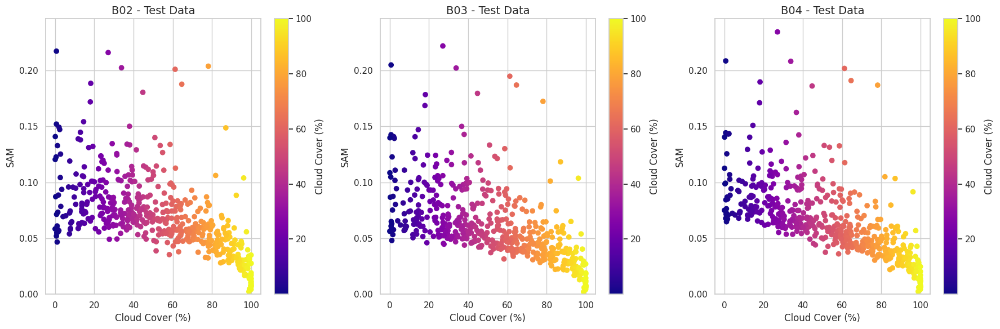

In [143]:
# Visualization for SAM vs Cloud Cover
sns.set(style="whitegrid")
fig, axs = plt.subplots(1, len(bands), figsize=(18, 6))
cmap = plt.cm.plasma
global_ymax = max(df_test_output[f'sam_{band}'].max() for band in bands) * 1.05  # 5% buffer

for i, band in enumerate(bands):
    ax = axs[i]
    scatter = ax.scatter(data=df_test_output, x='cloud_cover', y=f'sam_{band}',
                        c=df_test_output['cloud_cover'], cmap=cmap)
    ax.set_title(f"{band} - Test Data", fontsize=14)
    ax.set_xlabel("Cloud Cover (%)", fontsize=12)
    ax.set_ylabel("SAM", fontsize=12)
    ax.set_ylim(0, global_ymax)
    plt.colorbar(scatter, ax=ax, label="Cloud Cover (%)")

plt.tight_layout()
plt.savefig(f"{exp_paths['metrics_path']}/sam_vs_cloud_cover.svg")
plt.show()
plt.close()

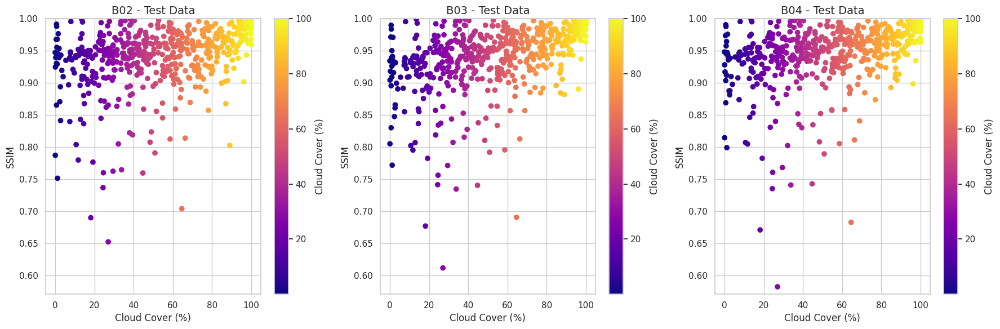

In [14]:
# Visualization for SSIM vs Cloud Cover
fig, axs = plt.subplots(1, len(bands), figsize=(18, 6))
global_ymin = min(df_test_output[f'ssim_{band}'].min() for band in bands) * 0.98  # 5% buffer

for i, band in enumerate(bands):
    ax = axs[i]
    scatter = ax.scatter(data=df_test_output, x='cloud_cover', y=f'ssim_{band}',
                        c=df_test_output['cloud_cover'], cmap=cmap)
    ax.set_title(f"{band} - Test Data", fontsize=14)
    ax.set_xlabel("Cloud Cover (%)", fontsize=12)
    ax.set_ylabel("SSIM", fontsize=12)
    ax.set_ylim(global_ymin, 1.0)
    plt.colorbar(scatter, ax=ax, label="Cloud Cover (%)")

plt.tight_layout()
plt.savefig(f"{exp_paths['metrics_path']}/ssim_vs_cloud_cover.svg")
plt.show()
plt.close()

## Plot SAM vs % Valid Pixel

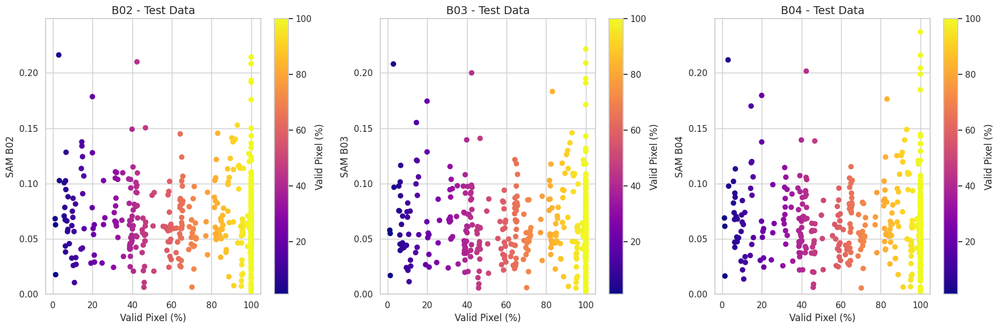

In [15]:
# Visualization for SAM vs Valid Pixel
fig, axs = plt.subplots(1, len(bands), figsize=(18, 6))
global_ymax = max(df_test_output[f'sam_{band}'].max() for band in bands) * 1.05

for i, band in enumerate(bands):
    ax = axs[i]
    scatter = ax.scatter(data=df_test_output, x='valid_pixel', y=f'sam_{band}',
                        c=df_test_output['valid_pixel'], cmap=cmap)
    ax.set_title(f"{band} - Test Data", fontsize=14)
    ax.set_xlabel("Valid Pixel (%)", fontsize=12)
    ax.set_ylabel(f"SAM {band}", fontsize=12)
    ax.set_ylim(0, global_ymax)
    plt.colorbar(scatter, ax=ax, label="Valid Pixel (%)")

plt.tight_layout()
plt.savefig(f"{exp_paths['metrics_path']}/sam_vs_valid_pixel.svg")
plt.show()
plt.close()

## Valid Pixel vs Cloud Cover vs SAM 

In [16]:
plot_3d_scatter(
    df=df_test_output,
    x_col='cloud_cover',
    y_col='valid_pixel',
    z_col='sam_B02',
    color_col='cloud_cover',
    labels={
        'cloud_cover': 'Cloud Cover (%)',
        'valid_pixel': 'Valid Pixels (%)',
        'sam_B02': 'SAM B02'
    },
    title='3D Scatter: SAM B02 vs Cloud Cover vs Valid Pixels',
    output_path=f"{exp_paths['metrics_path']}/sam_vs_valid_pixel_cloud_cover.html"
)

## Identification top worst predictions for SAM and SSIM

In [ ]:
# Top worst predictions for SAM and SSIM
top_10_min_ssim_idx = df_test_output.sort_values(f'ssim_B02').head(10).index.tolist()
top_10_max_sam_idx = df_test_output.sort_values(f'sam_B02', ascending=False).head(10).index.tolist()

logger.info(f"Top 10 indices with minimum SSIM for B02: {top_10_min_ssim_idx}")
logger.info(f"Top 10 indices with maximum SAM for B02: {top_10_max_sam_idx}")

In [ ]:
# Evaluate and plot for worst SAM predictions
outputs_worst_sam_path = f"{exp_paths['metrics_path']}/outputs_worst_sam"
os.makedirs(outputs_worst_sam_path, exist_ok=True)

for idx in top_10_max_sam_idx:
    evaluate_and_plot(model, df_test_input, df_test_output, bands=bands, resize=resize,
                    device=device, index=idx, verbose=False, save=True, output_path=outputs_worst_sam_path)

In [ ]:
# Evaluate and plot for worst SSIM predictions
outputs_worst_ssim_path = f"{exp_paths['metrics_path']}/outputs_worst_ssim"
os.makedirs(outputs_worst_ssim_path, exist_ok=True)

for idx in top_10_min_ssim_idx:
    evaluate_and_plot(model, df_test_input, df_test_output, bands=bands, resize=resize,
                    device=device, index=idx, verbose=False, save=True, output_path=outputs_worst_ssim_path)

In [159]:
def evaluate_and_plot(model, df_test_input, df_test_output, bands,cmap,  resize, device, index, verbose, save, output_path):
    """
    Evaluates and plots input, target, prediction, and absolute difference for a specific index.

    Parameters:
        model: Trained model for evaluation.
        df_test_input: DataFrame containing the input data paths.
        df_test_output: DataFrame containing the output data paths.
        bands: List of band names (e.g., ['B02', 'B03', 'B04']) to evaluate.
        resize: The resize dimension for images.
        device: The device (CPU or GPU) to run the model on.
        index: The specific index to evaluate from the data.
    """
    # Load input data and mask
    x_paths = natsort.natsorted(glob.glob(os.path.join(df_test_input["path"][index], "*.png"), recursive=False))
    x_data, x_mask = read_images(x_paths)
    x_data = cv2.resize(x_data, (resize, resize), interpolation=cv2.INTER_AREA)
    x_mask = cv2.resize(x_mask.astype(np.uint8), (resize, resize), interpolation=cv2.INTER_NEAREST).astype(bool)

    # Load output data and mask
    y_paths = natsort.natsorted(glob.glob(os.path.join(df_test_output["path"][index], "*.png"), recursive=False))
    y_data, y_mask = read_images(y_paths)
    y_data = cv2.resize(y_data, (resize, resize), interpolation=cv2.INTER_AREA)
    y_mask = cv2.resize(y_mask.astype(np.uint8), (resize, resize), interpolation=cv2.INTER_NEAREST).astype(bool)

    # Combine masks: valid only where both input and target are valid
    valid_mask = x_mask

    # Prepare tensors for inference
    x_tensor = torch.from_numpy(x_data).float().permute(2, 0, 1).unsqueeze(0).to(device)  # [1, C, H, W]

    # Inference
    model.eval()
    with torch.no_grad():
        pred_tensor = model(x_tensor)

    # Convert tensors to NumPy
    x_np = x_tensor.cpu().numpy()[0].transpose(1, 2, 0)       # [H, W, C]
    y_np = torch.from_numpy(y_data).numpy()                   # [H, W, C]
    pred_np = pred_tensor.cpu().numpy()[0].transpose(1, 2, 0) # [H, W, C]

    # Apply mask: set invalid pixels to 0
    # x_np[~valid_mask] = 0.0
    y_np[~valid_mask] = 0.0
    pred_np[~valid_mask] = 0.0

    # Plot results for each band
    for idx, band in enumerate(bands):
        fig, axs = plt.subplots(1, 4, figsize=(20, 6))

        vmin = 0
        vmax = 1  # Normalized range

        # Input
        im0 = axs[0].imshow(x_np[:, :, idx], cmap=cmap, vmin=vmin, vmax=vmax)
        axs[0].set_title(f"Input - {band}", fontsize=14)
        axs[0].axis('off')
        plt.colorbar(im0, ax=axs[0], fraction=0.046, pad=0.04)

        # Target
        im1 = axs[1].imshow(y_np[:, :, idx], cmap=cmap, vmin=vmin, vmax=vmax)
        axs[1].set_title(f"Target - {band}", fontsize=14)
        axs[1].axis('off')
        plt.colorbar(im1, ax=axs[1], fraction=0.046, pad=0.04)

        # Prediction
        im2 = axs[2].imshow(pred_np[:, :, idx], cmap=cmap, vmin=vmin, vmax=vmax)
        axs[2].set_title(f"Prediction - {band}", fontsize=14)
        axs[2].axis('off')
        plt.colorbar(im2, ax=axs[2], fraction=0.046, pad=0.04)

        # Absolute Difference
        diff_target_pred = np.abs(y_np[:, :, idx] - pred_np[:, :, idx])
        im3 = axs[3].imshow(diff_target_pred, cmap=cmap, vmin=0, vmax=diff_target_pred.max())
        axs[3].set_title(f"Abs Difference - {band}", fontsize=14)
        axs[3].axis('off')
        plt.colorbar(im3, ax=axs[3], fraction=0.046, pad=0.04)

        plt.tight_layout()

        if verbose:
            plt.show()

        if save:
            _, head = os.path.split(df_test_input["path"][index])
            filename = f"{output_path}/{head}_{band}.svg"
            fig.savefig(filename)

        plt.close()

## Identification to best predictions for SAM and SSIM

In [ ]:
# Top best predictions for SAM and SSIM
top_10_max_ssim_idx = df_test_output.sort_values(f'ssim_B02').tail(20).index.tolist()
top_10_min_sam_idx = df_test_output.sort_values(f'sam_B02', ascending=False).tail(20).index.tolist()

logger.info(f"Top 10 indices with maximum SSIM for B02: {top_10_max_ssim_idx}")
logger.info(f"Top 10 indices with minimum SAM for B02: {top_10_min_sam_idx}")

# Evaluate and plot for best SAM predictions
output_best_sam_path = f"{exp_paths['result_dir']}/outputs_best_sam"
os.makedirs(output_best_sam_path, exist_ok=True)

for idx in top_10_min_sam_idx:
    evaluate_and_plot(model, df_test_input, df_test_output, bands=bands, resize=resize,
                    device=device, index=idx, verbose=False, save=True, output_path=output_best_sam_path)

# Evaluate and plot for best SSIM predictions
output_best_ssim_path = f"{exp_paths['result_dir']}/outputs_best_ssim"
os.makedirs(output_best_ssim_path, exist_ok=True)

for idx in top_10_max_ssim_idx:
    evaluate_and_plot(model, df_test_input, df_test_output, bands=bands, resize=resize,
                    device=device, index=idx, verbose=False, save=True, output_path=output_best_ssim_path)